In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

In [2]:
equity = "HDFCBANK.NS"  # HDFC Bank
data = yf.download(equity, start="2013-07-05", end="2023-07-05")


[*********************100%***********************]  1 of 1 completed


In [3]:
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-07-05,330.049988,336.375000,329.250000,333.875000,310.440247,4771748
2013-07-08,332.000000,333.725006,326.375000,330.225006,307.046448,3584648
2013-07-09,331.100006,336.875000,331.100006,335.149994,311.625763,3520096
2013-07-10,335.125000,335.950012,328.075012,329.649994,306.511871,3569290
2013-07-11,333.500000,343.350006,333.024994,341.625000,317.646271,5299784


In [4]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2.464000e+03
mean,958.494359,967.263351,949.065149,958.352273,927.968802,6.516370e+06
std,422.686706,426.449650,418.790258,422.595425,422.487413,6.772787e+06
min,277.850006,286.000000,264.000000,280.950012,261.230072,0.000000e+00
25%,539.087494,543.062500,534.250000,539.518753,508.822121,2.813840e+06
50%,973.725006,982.487488,961.462494,973.637512,936.967285,4.787936e+06
75%,1357.725006,1371.024994,1342.587494,1355.737518,1334.755615,7.897983e+06
max,1723.449951,1757.500000,1713.800049,1728.199951,1728.199951,2.011300e+08


In [5]:
# Here we are defining a function to evaluate keltner channel

def calculate_keltner_channel(data, ema_period=20, atr_period=10, multiplier=2):
    
    # Exponential Moving Average (EMA)
    ema = data['Close'].ewm(span=ema_period, adjust=False).mean()

    #Average True Range (ATR)
    high_low = data['High'] - data['Low']
    high_close = np.abs(data['High'] - data['Close'].shift())
    low_close = np.abs(data['Low'] - data['Close'].shift())
    true_range = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    atr = true_range.rolling(atr_period).mean()

    #Keltner Channel
    upper_band = ema + (multiplier * atr)
    lower_band = ema - (multiplier * atr)

    return ema, upper_band, lower_band


In [6]:
#Keltner Channel figure for each year
start_date = pd.to_datetime("2013-07-05")
end_date = pd.to_datetime("2023-07-05")

C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\1285737661.py:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  year_data = data[str(year)]


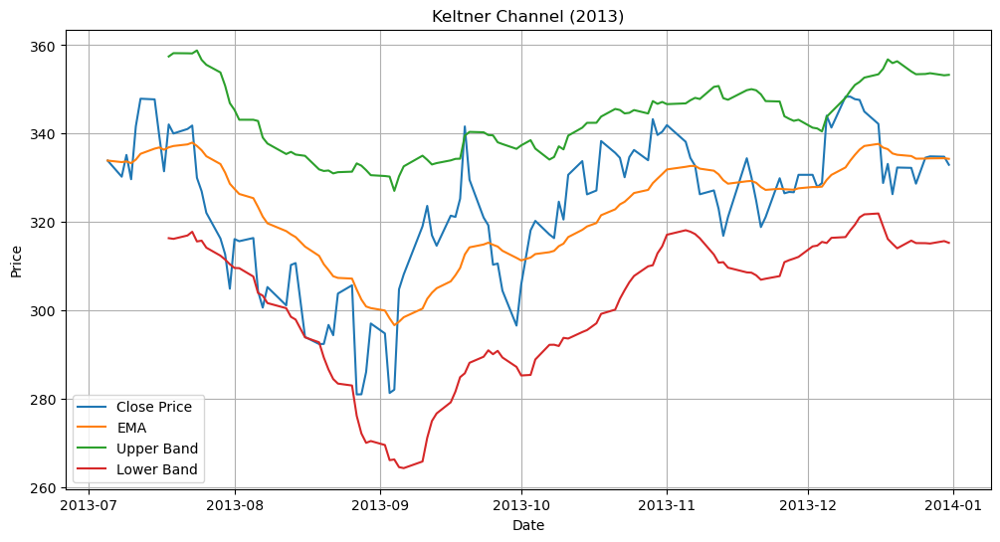

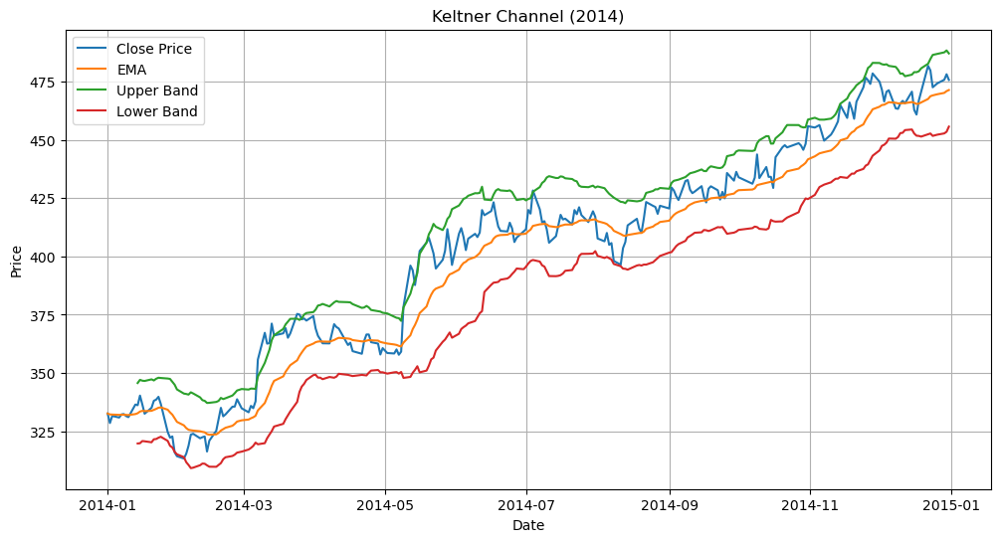

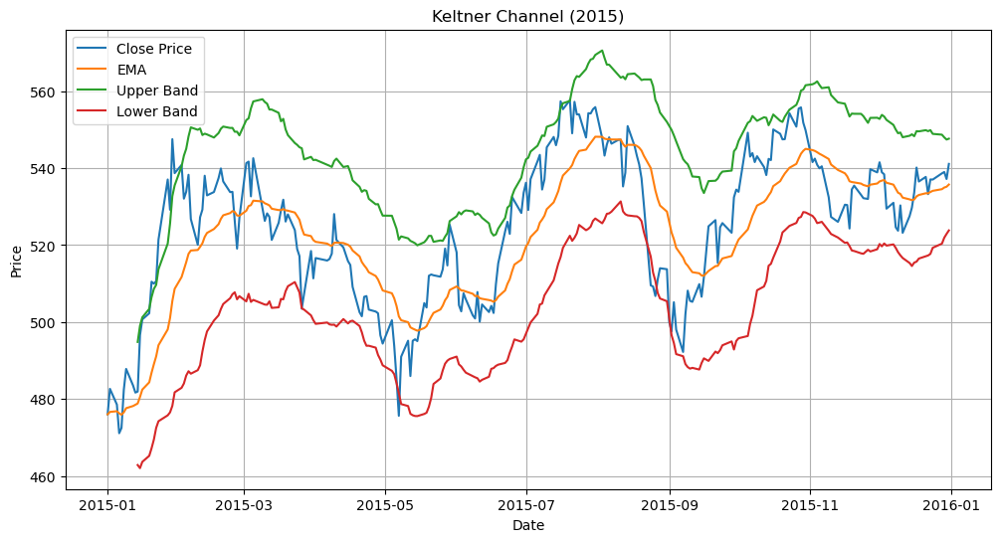

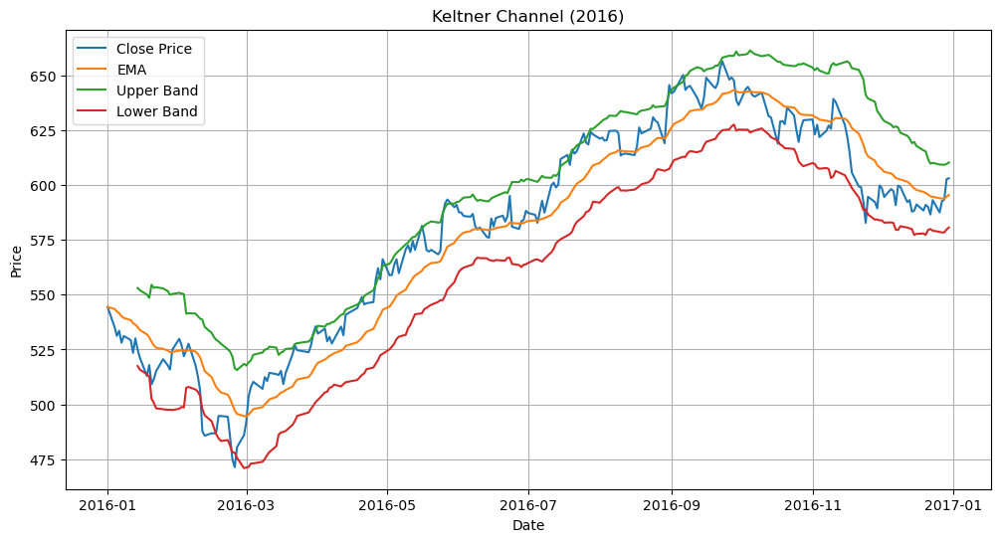

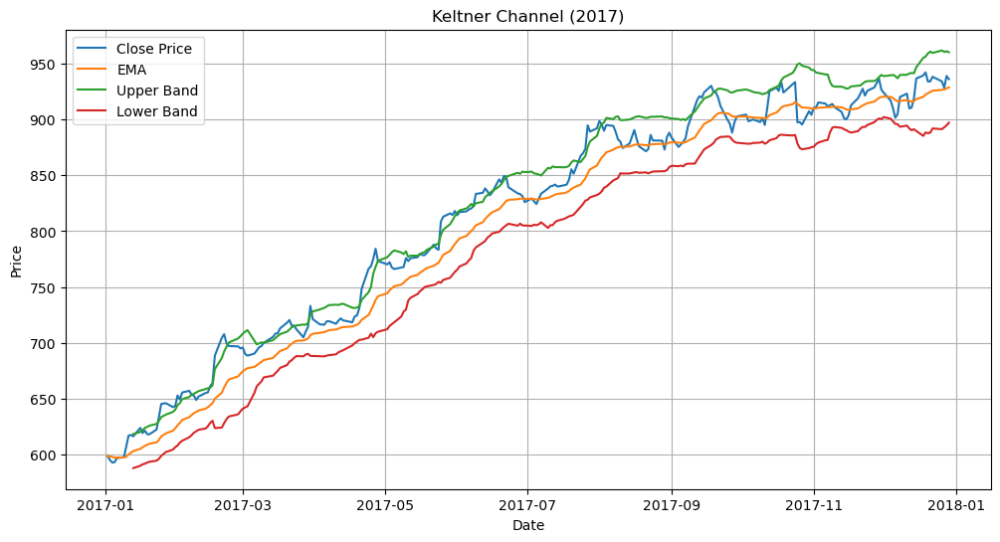

...

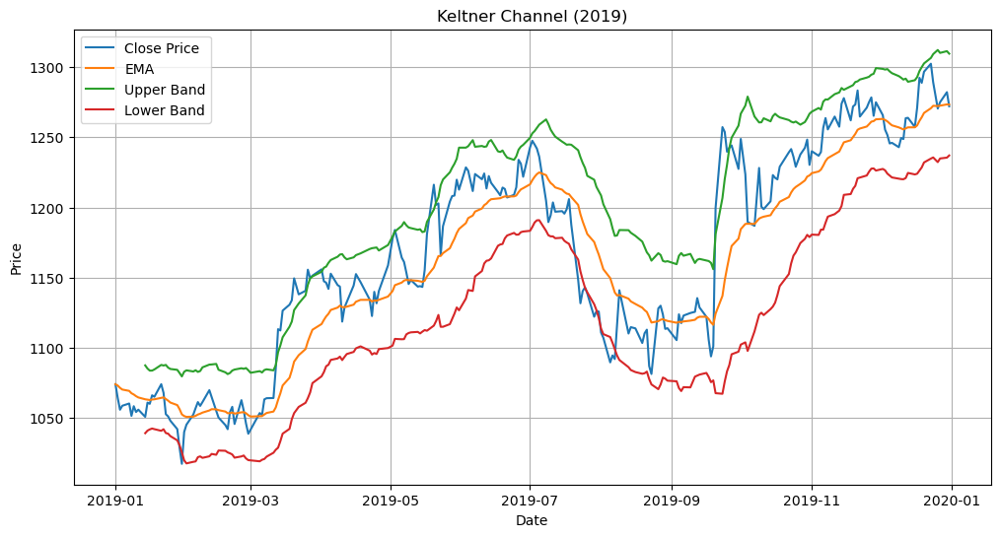

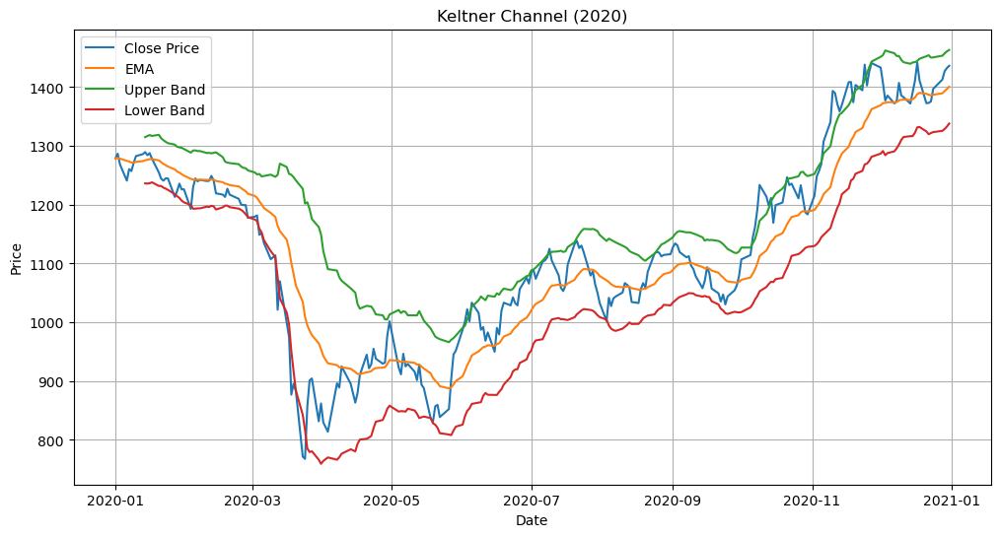

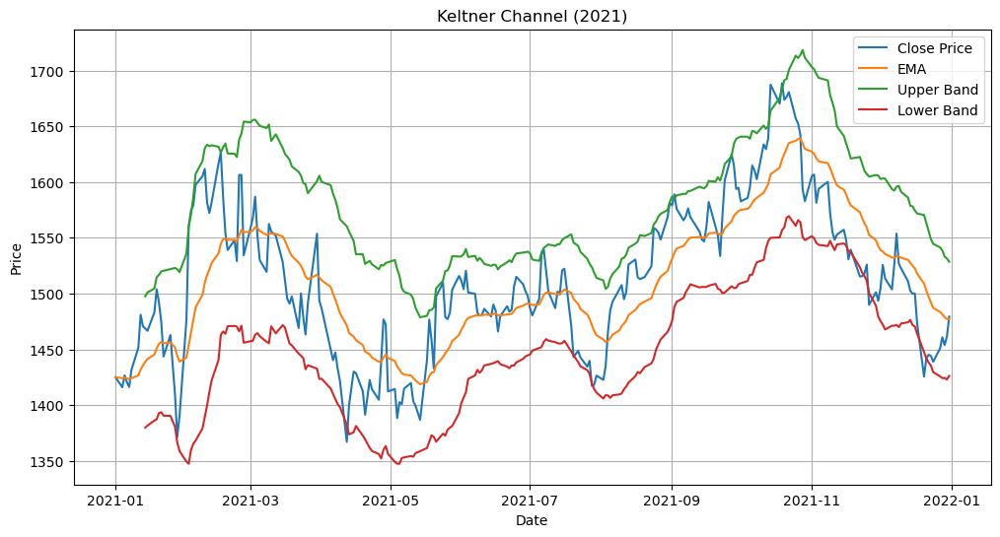

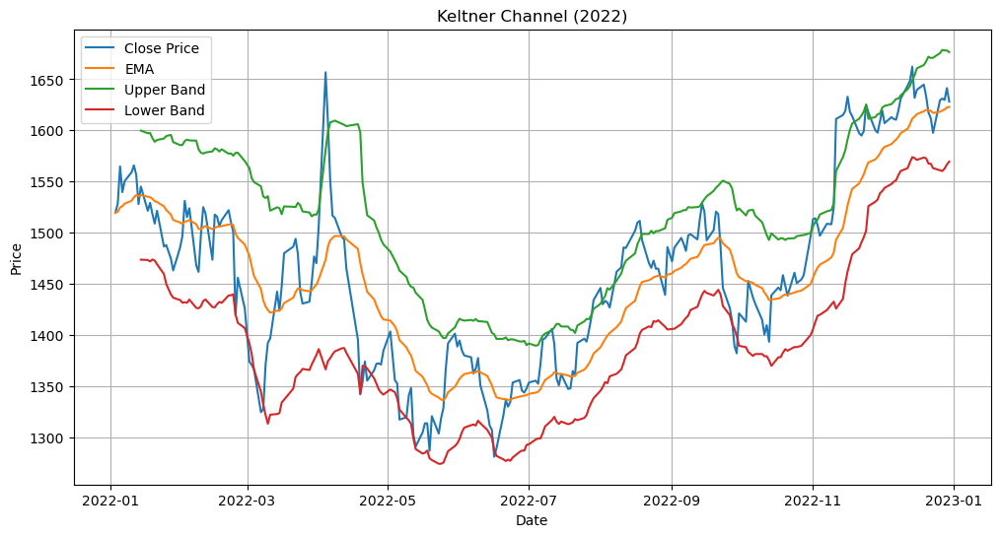

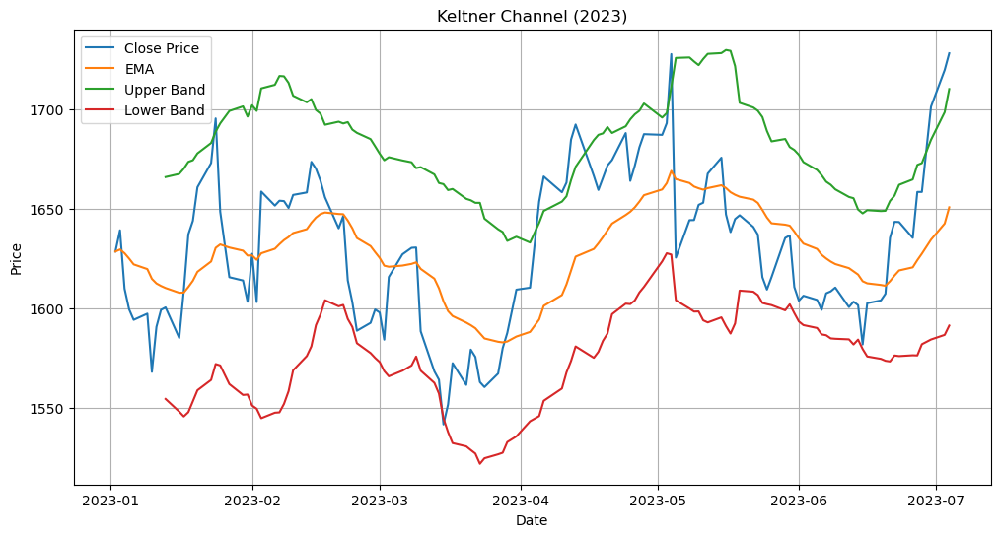

In [7]:
for year in range(start_date.year, end_date.year + 1):
    year_data = data[str(year)]
    ema, upper_band, lower_band = calculate_keltner_channel(year_data)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(year_data.index, year_data['Close'], label='Close Price')
    plt.plot(year_data.index, ema, label='EMA')
    plt.plot(year_data.index, upper_band, label='Upper Band')
    plt.plot(year_data.index, lower_band, label='Lower Band')
    plt.title('Keltner Channel ({0})'.format(year))
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

## The graph graph can be explained as when the closing price consistently reaches or exceeds the upper band, it may suggest an overbought condition, indicating a potential reversal or correction. Conversely, when the closing price consistently falls below the lower band, it may indicate an oversold condition, signaling a potential bounce or upward move.

C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\3296366155.py:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  year_data = data[str(year)]


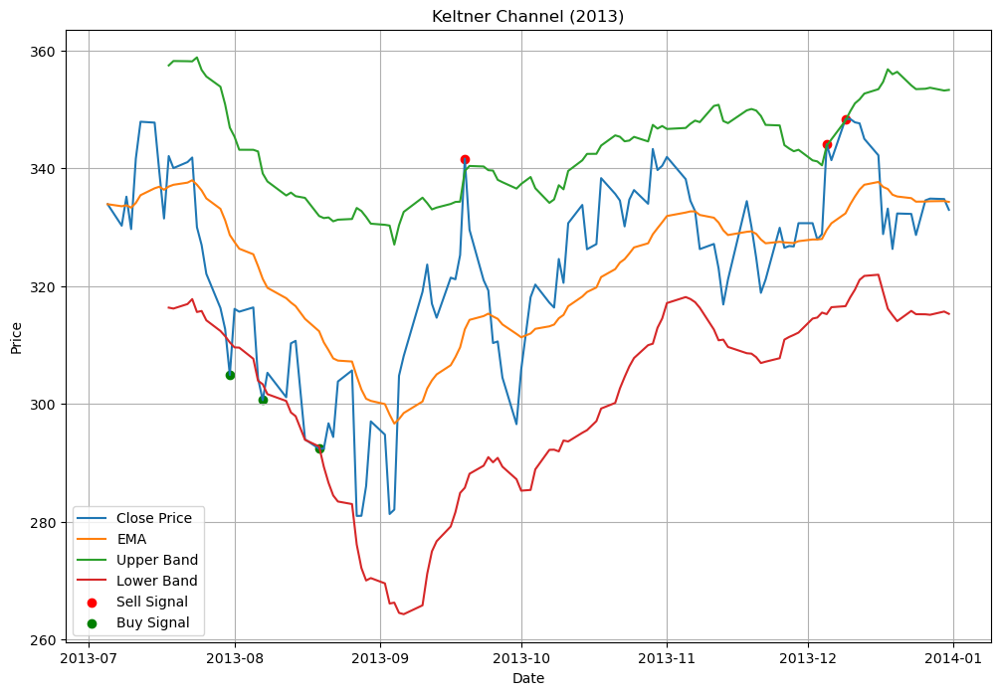

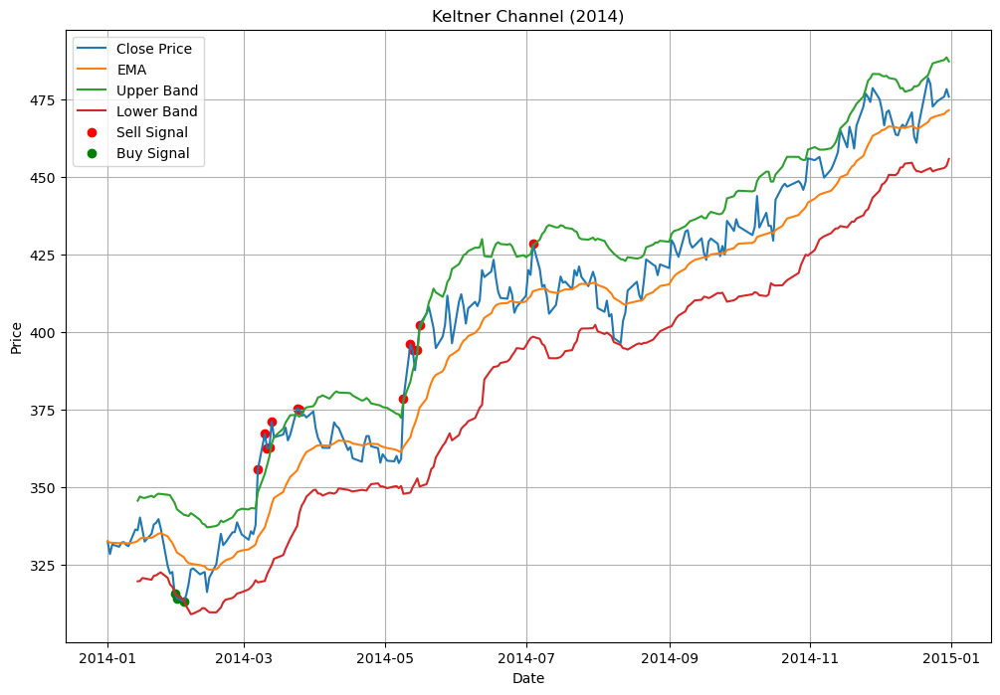

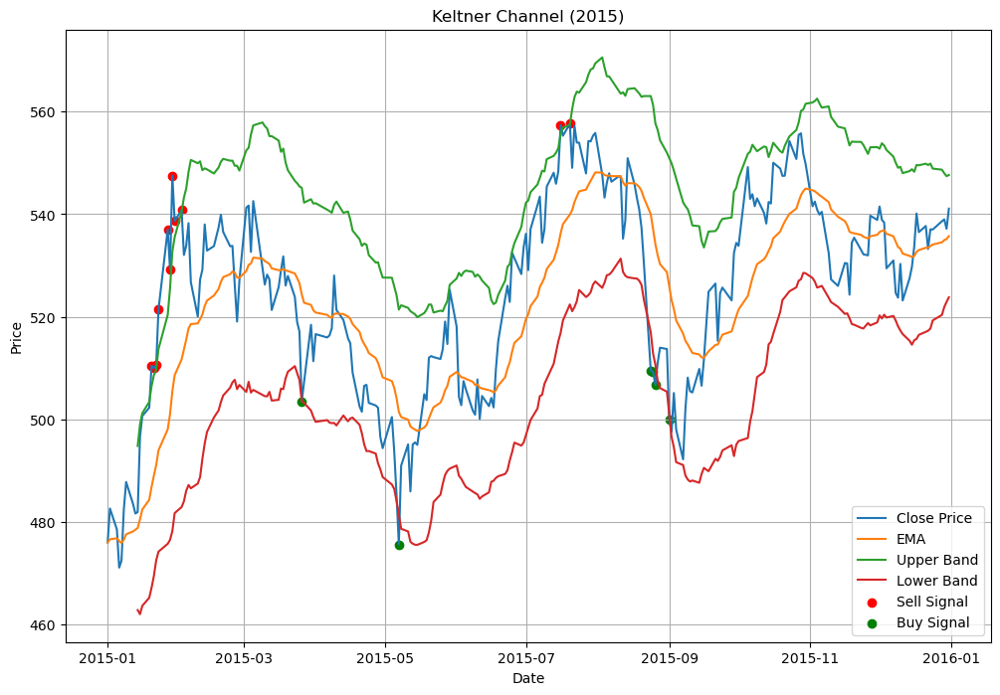

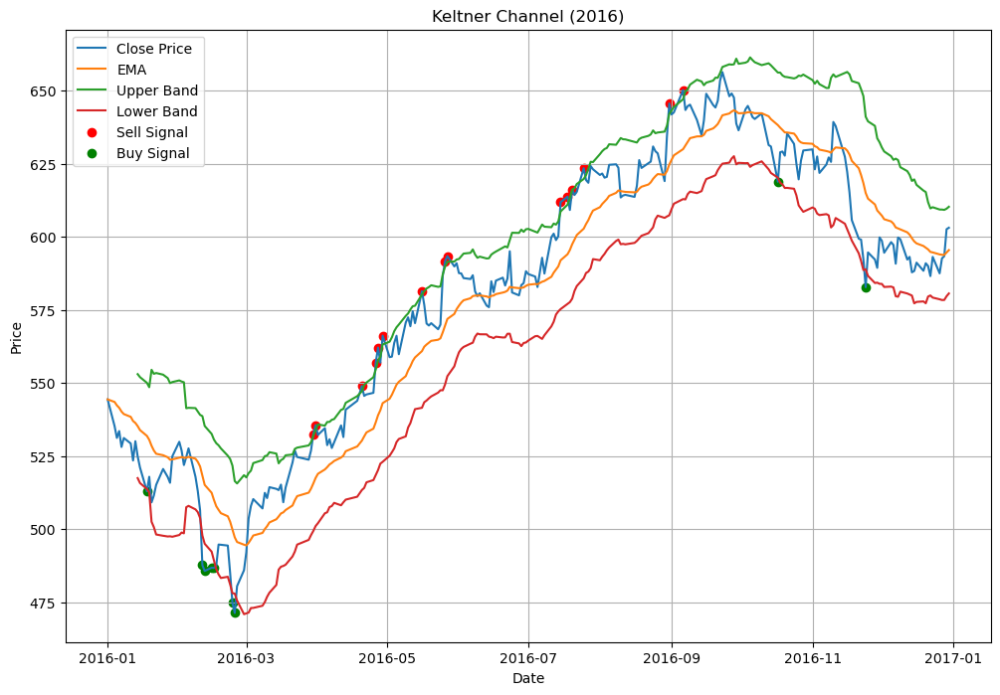

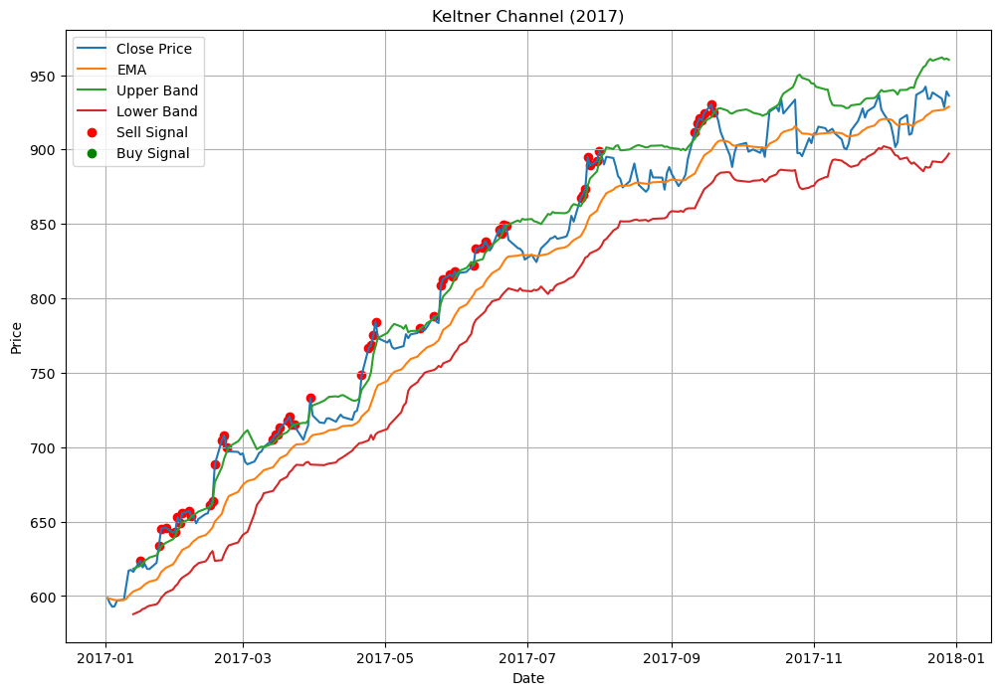

...

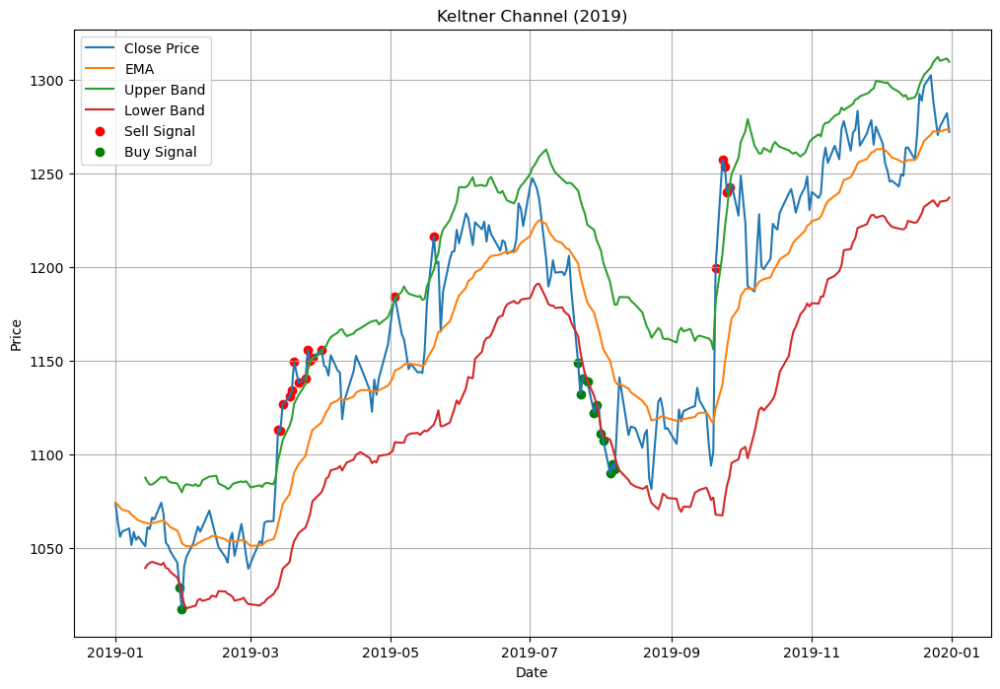

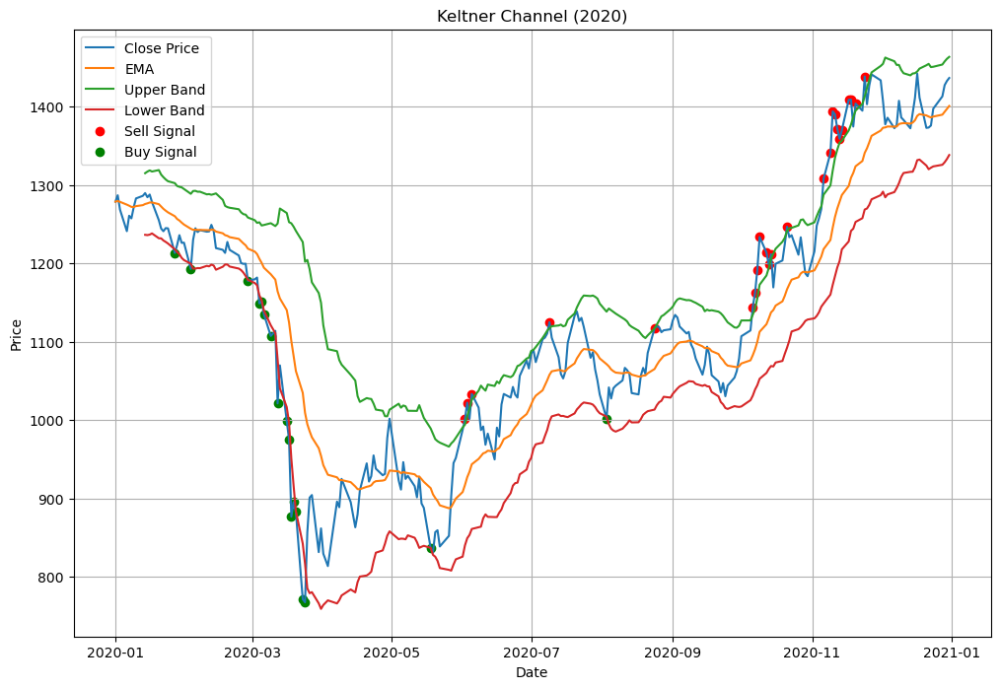

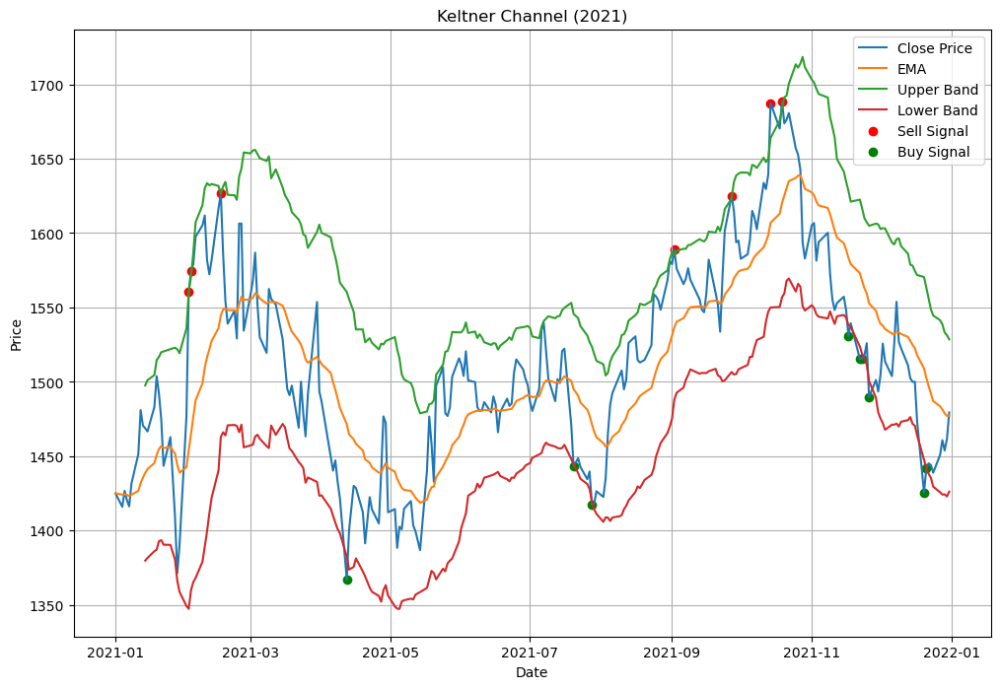

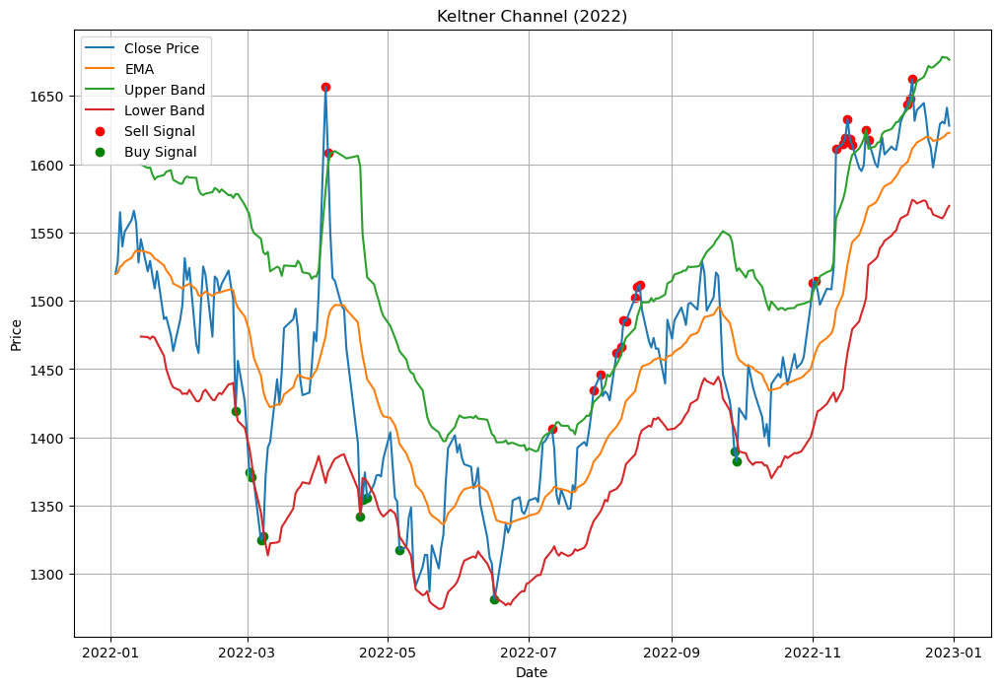

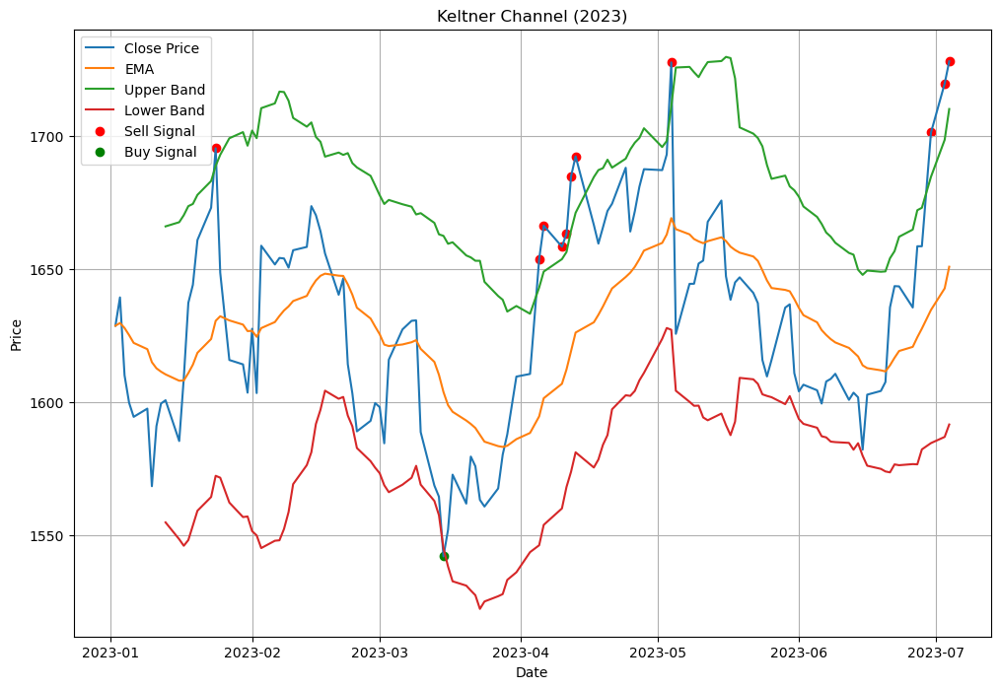

In [8]:
for year in range(start_date.year, end_date.year + 1):
    year_data = data[str(year)]
    ema, upper_band, lower_band = calculate_keltner_channel(year_data)

    # Here we are generating sell and buy signals
    sell_signals = year_data[year_data['Close'] > upper_band]['Close']
    buy_signals = year_data[year_data['Close'] < lower_band]['Close']

    # Plotting
    plt.figure(figsize=(12, 8))
    plt.plot(year_data.index, year_data['Close'], label='Close Price')
    plt.plot(year_data.index, ema, label='EMA')
    plt.plot(year_data.index, upper_band, label='Upper Band')
    plt.plot(year_data.index, lower_band, label='Lower Band')
    plt.scatter(sell_signals.index, sell_signals, color='red', label='Sell Signal', marker='o')
    plt.scatter(buy_signals.index, buy_signals, color='green', label='Buy Signal', marker='o')
    plt.title('Keltner Channel ({0})'.format(year))
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

## Trading Strategy:
## Buy when the price is below the lower line of the Keltner Channel.
## Sell when the price is above the upper line of the Keltner Channel.

In [9]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [10]:
start_date = pd.to_datetime("2013-07-05")
end_date = pd.to_datetime("2023-07-05")

for year in range(start_date.year, end_date.year + 1):
    year_data = data[str(year)]

    # Preparing data for candlestick plot
    candlestick = go.Candlestick(
        x=year_data.index,
        open=year_data['Open'],
        high=year_data['High'],
        low=year_data['Low'],
        close=year_data['Close']
    )

    # Plotting
    layout = go.Layout(
        title='Candlestick Chart ({0})'.format(year),
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price'),
        showlegend=False
    )
    fig = go.Figure(data=[candlestick], layout=layout)
    fig.show()

C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\3930643967.py:5: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  year_data = data[str(year)]


C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\3930643967.py:5: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



In [11]:
for year in range(start_date.year, end_date.year + 1):
    year_data = data[str(year)]
    ema, upper_band, lower_band = calculate_keltner_channel(year_data)

    # Here we are preparing data for candlestick plot
    candlestick = go.Candlestick(
        x=year_data.index,
        open=year_data['Open'],
        high=year_data['High'],
        low=year_data['Low'],
        close=year_data['Close']
    )

    #Here we are plotting
    fig = go.Figure()

    # Here we are adding candlestick trace
    fig.add_trace(candlestick)

    # Here we are adding Keltner Channel lines
    fig.add_trace(go.Scatter(
        x=year_data.index, y=ema,
        mode='lines',
        name='EMA',
        line=dict(color='blue')
    ))
    fig.add_trace(go.Scatter(
        x=year_data.index, y=upper_band,
        mode='lines',
        name='Upper Band',
        line=dict(color='orange')
    ))
    fig.add_trace(go.Scatter(
        x=year_data.index, y=lower_band,
        mode='lines',
        name='Lower Band',
        line=dict(color='orange')
    ))

    # Here we are setting layout
    fig.update_layout(
        title='Keltner Channel and Candlestick Chart ({0})'.format(year),
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price')
    )

    # Show the combined plot
    fig.show()

C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\3683145832.py:2: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



In [12]:
start_date = pd.to_datetime("2013-07-05")
end_date = pd.to_datetime("2023-07-05")

for year in range(start_date.year, end_date.year + 1):
    year_data = data[str(year)]
    ema, upper_band, lower_band = calculate_keltner_channel(year_data)

    # Here we are preparing data for candlestick plot
    candlestick = go.Candlestick(
        x=year_data.index,
        open=year_data['Open'],
        high=year_data['High'],
        low=year_data['Low'],
        close=year_data['Close']
    )

    # Here we are plotting
    fig = go.Figure()

    # Here we are adding candlestick trace
    fig.add_trace(candlestick)

    # Here we are adding Keltner Channel lines
    fig.add_trace(go.Scatter(
        x=year_data.index, y=ema,
        mode='lines',
        name='EMA',
        line=dict(color='blue')
    ))
    fig.add_trace(go.Scatter(
        x=year_data.index, y=upper_band,
        mode='lines',
        name='Upper Band',
        line=dict(color='orange')
    ))
    fig.add_trace(go.Scatter(
        x=year_data.index, y=lower_band,
        mode='lines',
        name='Lower Band',
        line=dict(color='orange')
    ))

    # Here we are finding hammer candlestick pattern
    hammer_pattern = year_data[(year_data['Low'] - year_data['Open']) > 2 * (year_data['Close'] - year_data['Open'])]

    # Here we are generating buy and sell signals
    buy_signals = hammer_pattern['High'] + 0.01
    sell_signals = hammer_pattern['Low'] - 0.01

    # Here we are plotting buy signals
    fig.add_trace(go.Scatter(
        x=hammer_pattern.index,
        y=buy_signals,
        mode='markers',
        marker=dict(symbol="cross", color="green"),
        name='Buy Signals'
    ))

    # Here we are plotting sell signals
    fig.add_trace(go.Scatter(
        x=hammer_pattern.index,
        y=sell_signals,
        mode='markers',
        marker=dict(symbol="cross", color="red"),
        name='Sell Signals'
    ))

    # Here we are setting layout
    fig.update_layout(
        title='Keltner Channel and Candlestick Chart ({0})'.format(year),
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price'),
        showlegend=True
    )

    fig.show()

C:\Users\rs725\AppData\Local\Temp\ipykernel_26520\1639489378.py:5: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



In [13]:
cumulative_returns = []
max_drawdowns = []
sharpe_ratios = []

In [14]:
#Returns, Drawdown, and Sharpe Ratio
returns = (hammer_pattern['Close'].pct_change() + 1).cumprod()
cumulative_returns.append(returns[-1] - 1)

# Drawdown
equity_curve = returns.cumprod()
previous_peaks = equity_curve.cummax()
drawdowns = (equity_curve - previous_peaks) / previous_peaks
max_drawdowns.append(drawdowns.max())

# Sharpe Ratio
daily_returns = hammer_pattern['Close'].pct_change()
sharpe_ratio = (daily_returns.mean() / daily_returns.std()) * np.sqrt(252)
sharpe_ratios.append(sharpe_ratio)

In [15]:
mean_cumulative_returns = np.mean(cumulative_returns)
mean_max_drawdowns = np.mean(max_drawdowns)
mean_sharpe_ratios = np.mean(sharpe_ratios)

In [16]:
print("Mean Cumulative Returns: ", mean_cumulative_returns)
print("Mean Maximum Drawdowns: ", mean_max_drawdowns)
print("Mean Sharpe Ratios: ", mean_sharpe_ratios)

Mean Cumulative Returns:  0.015838016972553604
Mean Maximum Drawdowns:  0.0
Mean Sharpe Ratios:  0.5018143822828961
